In [1]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import torch.nn as nn
import numpy as np
import torchvision.models as models
import torch.optim as optim
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy.fft as nf
import os
import math
import time

from pathlib import Path
from tensorly.decomposition import parafac
try:
    from skimage.restoration import denoise_tv_chambolle
except ImportError:
    # skimage < 0.12
    from skimage.filters import denoise_tv_chambolle

from img_utils import full_trace
    
import bm3d

import random


In [2]:
FS_PATCH_ID_RANGE_MIN, FS_PATCH_ID_RANGE_MAX = 0,1000-1
THEBE_PATCH_ID_RANGE_MIN, THEBE_PATCH_ID_RANGE_MAX = 0,1000-1
BEATRICE_PATCH_ID_RANGE_MIN, BEATRICE_PATCH_ID_RANGE_MAX = 0,1000-1
SYNTHETIC_PATCH_ID_RANGE_MIN, SYNTHETIC_PATCH_ID_RANGE_MAX = 0,1000-1

def normalize(img, min_val = 0, max_val = 1):
    return (img - np.min(img)) / (np.max(img) - np.min(img)) * (max_val - min_val) + min_val

def single2tensor4(img):
    return torch.from_numpy(np.ascontiguousarray(img)).permute(2, 0, 1).float().unsqueeze(0)

def npy_to_rgb(img):
    # Expand the 1 channel grayscale to 3 channel grayscale image
    temp = np.zeros(img.shape + (3,), dtype=np.float32)
    temp[:, :, 0] = img
    temp[:, :, 1] = img.copy()
    temp[:, :, 2] = img.copy()
    img = temp

    # RGB -> BGR
    img = img[:, :, ::-1]

#     img = img.transpose((2, 0, 1)).astype('float32')
    img = single2tensor4(img)
    img = img.to(device)
    return img

def rgb_to_npy(img):
#     print(img)
    return normalize((.2126 * img[:,:,2] + .7152 * img[:,:,1] + .0722 * img[:,:,0]).clip(0, 255), 0, 1)

In [3]:
CUDA_DEVICE = "3"
os.environ["CUDA_VISIBLE_DEVICES"] = CUDA_DEVICE  # Only GPU 3 is visible to this code
#Loadung the model vgg19 that will serve as the base model
model=models.vgg19(pretrained=True).features
#Assigning the GPU to the variable device
device=torch.device( "cuda" if (torch.cuda.is_available()) else 'cpu')

In [4]:

import torch.nn as nn
import torch.nn.functional as F
import torch

class three_conv(nn.Module):
    def __init__(self, in_channels=16, out_channels=16, kernel_size=3, stride=1, padding="same", dilation=1):
        super(three_conv, self).__init__()
        self.conv = nn.Sequential(
                    nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size,stride=stride, padding=padding, dilation=dilation),
                    nn.BatchNorm2d(out_channels),
                    nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size,stride=stride, padding=padding, dilation=dilation),
                    nn.BatchNorm2d(out_channels),
                    nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size,stride=stride, padding=padding, dilation=dilation),
                    nn.BatchNorm2d(out_channels),
                    nn.ReLU(inplace=True))

    def forward(self, x):
        x = self.conv(x)
        return x

class MFF(nn.Module):
    def __init__(self, channel=16):
        super(MFF, self).__init__()

        self.conv_3x3 = three_conv(channel, channel, kernel_size=3, stride=1, padding='same', dilation=1)
        self.conv_5x5 = three_conv(channel, channel, kernel_size=5, stride=1, padding='same', dilation=1)
        self.conv_7x7 = three_conv(channel, channel, kernel_size=7, stride=1, padding='same', dilation=1)
        self.conv_fusion = nn.Sequential(
                    nn.Conv2d(channel*3, channel, kernel_size=3,stride=1, padding='same'),
                    nn.BatchNorm2d(channel),
                    nn.ReLU(inplace=True),
                    nn.Conv2d(channel, channel, kernel_size=3,stride=1, padding='same'),
                    nn.BatchNorm2d(channel),
                    nn.ReLU(inplace=True))
        

    def forward(self, x):
        identity = x
              
        out1 = self.conv_3x3(x)
        out2 = self.conv_5x5(x)
        out3 = self.conv_7x7(x)
        
        fusion = torch.cat([out1, out2, out3], 1)
        out = self.conv_fusion(fusion)
        
        fusionout = out - identity
        
        return fusionout




class MFFCNN(nn.Module):
    def __init__(self):
        super(MFFCNN, self).__init__()
        self.headconv = nn.Conv2d(1, 16, 3, padding="same")
        self.relu = nn.ReLU()
        self.block1 = MFF(16)
        self.block2 = MFF(16)
        self.block3 = MFF(16)
        self.tailconv = nn.Conv2d(16, 1, 3, padding="same")


    def forward(self, inputs):
        headout = self.relu(self.headconv(inputs))
        bodyout = self.block3(self.block2(self.block1(headout)))
        out = self.relu(self.tailconv(bodyout))
        return out

class ASPP_16(nn.Module):
    def __init__(self, channel=16):
        super(ASPP_16, self).__init__()

        self.conv_1x1_1 = nn.Conv2d(channel, channel, kernel_size=1)
        self.bn_conv_1x1_1 = nn.BatchNorm2d(channel)

        self.conv_3x3_1 = nn.Conv2d(channel, channel, kernel_size=3, stride=1, padding="same", dilation=1)
        self.bn_conv_3x3_1 = nn.BatchNorm2d(channel)

        self.conv_3x3_2 = nn.Conv2d(channel, channel, kernel_size=3, stride=1, padding="same", dilation=2)
        self.bn_conv_3x3_2 = nn.BatchNorm2d(channel)

        self.conv_3x3_3 = nn.Conv2d(channel, channel, kernel_size=3, stride=1, padding="same", dilation=3)
        self.bn_conv_3x3_3 = nn.BatchNorm2d(channel)

        self.avg_pool = nn.AdaptiveAvgPool2d(1)

        self.conv_1x1_2 = nn.Conv2d(channel, channel, kernel_size=1)
        self.bn_conv_1x1_2 = nn.BatchNorm2d(channel)

        self.conv_1x1_3 = nn.Conv2d(channel*5, channel, kernel_size=1) 
        self.bn_conv_1x1_3 = nn.BatchNorm2d(channel)

        self.conv_1x1_4 = nn.Conv2d(channel, channel, kernel_size=1)

    def forward(self, feature_map):
        # (feature_map has shape (batch_size, channel, h, w))

        feature_map_h = feature_map.size()[2] # (== h)
        feature_map_w = feature_map.size()[3] # (== w)

        out_1x1 = F.relu(self.bn_conv_1x1_1(self.conv_1x1_1(feature_map))) # (shape: (batch_size, 256, h/16, w/16))
        out_3x3_1 = F.relu(self.bn_conv_3x3_1(self.conv_3x3_1(feature_map))) # (shape: (batch_size, 256, h/16, w/16))
        out_3x3_2 = F.relu(self.bn_conv_3x3_2(self.conv_3x3_2(feature_map))) # (shape: (batch_size, 256, h/16, w/16))
        out_3x3_3 = F.relu(self.bn_conv_3x3_3(self.conv_3x3_3(feature_map))) # (shape: (batch_size, 256, h/16, w/16))

        out_img = self.avg_pool(feature_map) # (shape: (batch_size, 512, 1, 1))
        out_img = F.relu(self.bn_conv_1x1_2(self.conv_1x1_2(out_img))) # (shape: (batch_size, 256, 1, 1))
        out_img = F.upsample(out_img, size=(feature_map_h, feature_map_w), mode="bilinear") # (shape: (batch_size, 256, h/16, w/16))

        out = torch.cat([out_1x1, out_3x3_1, out_3x3_2, out_3x3_3, out_img], 1) # (shape: (batch_size, 1280, h/16, w/16))
        out = F.relu(self.bn_conv_1x1_3(self.conv_1x1_3(out))) # (shape: (batch_size, 256, h/16, w/16))
        out = self.conv_1x1_4(out) # (shape: (batch_size, num_classes, h/16, w/16))
        
        
        return out
    
class ASPPCNN(nn.Module):
    def __init__(self):
        super(ASPPCNN, self).__init__()
        self.headconv = nn.Conv2d(1, 16, 3, padding="same")
        self.relu = nn.ReLU()
        self.block1 = ASPP_16(16)
        self.block2 = ASPP_16(16)
        self.block3 = ASPP_16(16)
        self.tailconv = nn.Conv2d(16, 1, 3, padding="same")


    def forward(self, inputs):
        headout = self.relu(self.headconv(inputs))
        bodyout = self.block3(self.block2(self.block1(headout)))
        out = self.relu(self.tailconv(bodyout))
        return out



In [5]:
iter_num = '8000'

from models.network_dncnn import DnCNN as net

model_c_thebe_s_beatrice = net()
model_c_thebe_s_beatrice.load_state_dict(torch.load('model_zoo/0406_beatrice_thebe_fault_256_96_256/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_c_thebe_s_beatrice.eval()
for k, v in model_c_thebe_s_beatrice.named_parameters():
    v.requires_grad = False
model_c_thebe_s_beatrice = model_c_thebe_s_beatrice.to(device)

model_test = net()
model_test.load_state_dict(torch.load('model_zoo/0414_thebe_fault_beatrice_96_256_256/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_test.eval()
for k, v in model_test.named_parameters():
    v.requires_grad = False
model_test = model_test.to(device)


model_c_fs_s_beatrice = net()
model_c_fs_s_beatrice.load_state_dict(torch.load('model_zoo/0406_beatrice_faultseg_256_96_256/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_c_fs_s_beatrice.eval()
for k, v in model_c_fs_s_beatrice.named_parameters():
    v.requires_grad = False
model_c_fs_s_beatrice = model_c_fs_s_beatrice.to(device)

model_c_synthetic_s_beatrice = net()
model_c_synthetic_s_beatrice.load_state_dict(torch.load('model_zoo/0406_beatrice_synthetic_256_96_256/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_c_synthetic_s_beatrice.eval()
for k, v in model_c_synthetic_s_beatrice.named_parameters():
    v.requires_grad = False
model_c_synthetic_s_beatrice = model_c_synthetic_s_beatrice.to(device)

model_c_synthetic_s_faultseg = net()
model_c_synthetic_s_faultseg.load_state_dict(torch.load('model_zoo/0405_faultseg_synthetic_256_96_input_96/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_c_synthetic_s_faultseg.eval()
for k, v in model_c_synthetic_s_faultseg.named_parameters():
    v.requires_grad = False
model_c_synthetic_s_faultseg = model_c_synthetic_s_faultseg.to(device)

model_beatrice_fs = net()
model_beatrice_fs.load_state_dict(torch.load('model_zoo/0401_faultseg_beatrice_256_96_512_new/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_beatrice_fs.eval()
for k, v in model_beatrice_fs.named_parameters():
    v.requires_grad = False
model_beatrice_fs = model_beatrice_fs.to(device)

model_c_thebe_s_fs = net()
model_c_thebe_s_fs.load_state_dict(torch.load('model_zoo/0405_faultseg_thebe_fault_256_96_input_96/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_c_thebe_s_fs.eval()
for k, v in model_c_thebe_s_fs.named_parameters():
    v.requires_grad = False
model_c_thebe_s_fs = model_c_thebe_s_fs.to(device)

model_c_fs_s_thebe = net()
model_c_fs_s_thebe.load_state_dict(torch.load('model_zoo/0406_thebe_faultseg_96_96_96/dncnn25/models/8000_G.pth'.format(iter_num)), strict=True)
model_c_fs_s_thebe.eval()
for k, v in model_c_fs_s_thebe.named_parameters():
    v.requires_grad = False
model_c_fs_s_thebe = model_c_fs_s_thebe.to(device)

model_c_synthetic_s_thebe = net()
model_c_synthetic_s_thebe.load_state_dict(torch.load('model_zoo/0406_thebe_synthetic_96_96_96/dncnn25/models/20000_G.pth'.format(iter_num)), strict=True)
model_c_synthetic_s_thebe.eval()
for k, v in model_c_synthetic_s_thebe.named_parameters():
    v.requires_grad = False
model_c_synthetic_s_thebe = model_c_synthetic_s_thebe.to(device)

model_o_synthetic_only = net()
model_o_synthetic_only.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/gaussian_to_synthetic/dncnn25/models/8000_G.pth'.format(iter_num)), strict=True)
model_o_synthetic_only.eval()
for k, v in model_o_synthetic_only.named_parameters():
    v.requires_grad = False
model_o_synthetic_only = model_o_synthetic_only.to(device)

model_o_asppcnn = ASPPCNN()
model_o_asppcnn.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/asppcnn/dncnn25/models/14000_G.pth'.format(iter_num)), strict=True)
model_o_asppcnn.eval()
for k, v in model_o_asppcnn.named_parameters():
    v.requires_grad = False
model_o_asppcnn = model_o_asppcnn.to(device)

model_o_mffcnn = MFFCNN()
model_o_mffcnn.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/mffcnn/dncnn25/models/14000_G.pth'.format(iter_num)), strict=True)
model_o_mffcnn.eval()
for k, v in model_o_mffcnn.named_parameters():
    v.requires_grad = False
model_o_mffcnn = model_o_mffcnn.to(device)

model_synthetic_only = net()
model_synthetic_only.load_state_dict(torch.load('model_zoo/faultseg_synthetic_gaussian/dncnn25/models/{}_G.pth'.format(iter_num)), strict=True)
model_synthetic_only.eval()
for k, v in model_synthetic_only.named_parameters():
    v.requires_grad = False
model_synthetic_only = model_synthetic_only.to(device)

# from network_dncnn import ASPPCNN as net

model_synthetic_only_clip= net()
model_synthetic_only_clip.load_state_dict(torch.load('model_zoo/0405_dncnn_fs_gaussian/dncnn25/models/8000_G.pth'.format(iter_num)), strict=True)
model_synthetic_only_clip.eval()
for k, v in model_synthetic_only_clip.named_parameters():
    v.requires_grad = False
model_synthetic_only_clip = model_synthetic_only_clip.to(device)

model_asppcnn = ASPPCNN()
model_asppcnn.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/asppcnn_clip/dncnn25/models/14000_G.pth'), strict=True)
model_asppcnn.eval()
for k, v in model_asppcnn.named_parameters():
    v.requires_grad = False
model_asppcnn = model_asppcnn.to(device)

model_asppcnn_clip = ASPPCNN()
model_asppcnn_clip.load_state_dict(torch.load('model_zoo/0405_asppcnn_fs_gaussian_128/dncnn25/models/8000_G.pth'), strict=True)
model_asppcnn_clip.eval()
for k, v in model_asppcnn_clip.named_parameters():
    v.requires_grad = False
model_asppcnn_clip = model_asppcnn_clip.to(device)

# from network_dncnn import MFFCNN as net

model_mffcnn = MFFCNN()
model_mffcnn.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/mffcnn/dncnn25/models/14000_G.pth'), strict=True)
model_mffcnn.eval()
for k, v in model_mffcnn.named_parameters():
    v.requires_grad = False
model_mffcnn = model_mffcnn.to(device)

model_mffcnn_clip = MFFCNN()
model_mffcnn_clip.load_state_dict(torch.load('model_zoo/0405_mffcnn_fs_gaussian_128/dncnn25/models/2000_G.pth'), strict=True)
model_mffcnn_clip.eval()
for k, v in model_mffcnn_clip.named_parameters():
    v.requires_grad = False
model_mffcnn_clip = model_mffcnn_clip.to(device)

from network_dncnn import MPRNet as net

model_mprnet = net()
model_mprnet.load_state_dict(torch.load('/home/haiwen/noise_reduction/data_final/model_zoo/mprnet/MPRNet/model_best.pth')["state_dict"], strict=True)
model_mprnet.eval()
for k, v in model_mprnet.named_parameters():
    v.requires_grad = False
model_mprnet = model_mprnet.to(device)

In [17]:
import torch
import sys
import torchvision.models as models
from torch.profiler import profile, record_function, ProfilerActivity

inputs1 = torch.randn(10, 1 , 512, 512).cuda()

with profile(activities=[ProfilerActivity.CPU],
        profile_memory=True, record_shapes=True) as prof:
    model_mffcnn(inputs1)
    
print(prof.key_averages().table(sort_by="self_cpu_memory_usage", row_limit=10))
with profile(activities=[ProfilerActivity.CPU],
        profile_memory=True, record_shapes=True) as prof:
    model_asppcnn(inputs1)

print(prof.key_averages().table(sort_by="self_cpu_memory_usage", row_limit=10))
with profile(activities=[ProfilerActivity.CPU],
        profile_memory=True, record_shapes=True) as prof:
    model_synthetic_only(inputs1)

print(prof.key_averages().table(sort_by="self_cpu_memory_usage", row_limit=10))
# inputs = torch.randn(1 , 3 , 1024, 1024).cuda()
# print(sys.getsizeof(inputs.storage()))

# with profile(activities=[ProfilerActivity.CPU],
#         profile_memory=True, record_shapes=True) as prof:
#     model_mprnet(inputs)

# print(prof.key_averages().table(sort_by="self_cpu_memory_usage", row_limit=10))

--------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                            Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg       CPU Mem  Self CPU Mem      CUDA Mem  Self CUDA Mem    # of Calls  
--------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                    aten::conv2d         2.45%     333.000us        59.16%       8.032ms     229.486us           0 b           0 b       5.32 Gb           0 b            35  
         aten::_convolution_mode         3.81%     517.000us        56.71%       7.699ms     219.971us           0 b           0 b       5.32 Gb           0 b            35  
              aten::_convolution         8.08%       1.097ms        52.90%       7.182ms     205.200us           0 b        

In [ ]:

st = time.time()
bm3d.bm3d(np.zeros((1024,1024)), sigma_psd=0.15, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
print(time.time()-st)

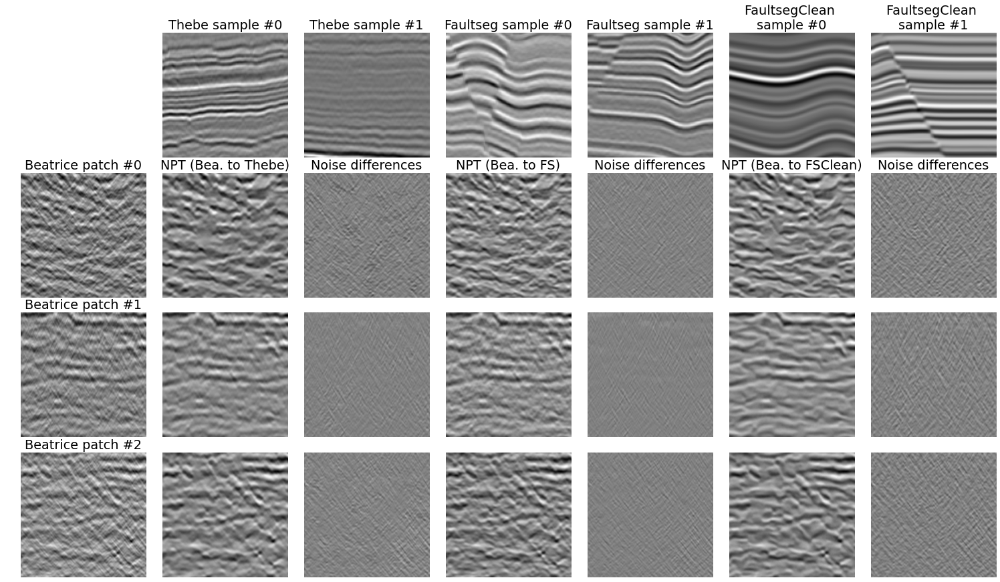

In [18]:
random.seed(0)

rows = 7

f, axarr = plt.subplots(4, rows, figsize = (27,15))
[axi.set_axis_off() for axi in axarr.ravel()]
plt.subplots_adjust(wspace =-0.1, hspace =0.12)
plt.rcParams.update({'font.size': 16})

ite = 0

for sample, min_range, max_range, patch_size, prefix, title  in zip(['parameter_test/thebe_fault_content', 'dataset_patches/faultseg_content_train', 'dataset_patches/faultseg_synthetic_content'],
                                                    [THEBE_PATCH_ID_RANGE_MIN, FS_PATCH_ID_RANGE_MIN, SYNTHETIC_PATCH_ID_RANGE_MIN],
                                                    [THEBE_PATCH_ID_RANGE_MAX, FS_PATCH_ID_RANGE_MAX, SYNTHETIC_PATCH_ID_RANGE_MAX],
                                                    [96, 96, 96],
                                                    ['', '', ''],
                                                    ['Thebe sample #{}','Faultseg sample #{}','FaultsegClean \nsample #{}']):
    for i in range(2):
        
        ite += 1
        
        idx = random.randint(min_range, max_range)
        s = np.load('{}/{}{}.npy'.format(sample, prefix, idx))[:patch_size,:patch_size]

        axarr[0, ite].imshow(s, cmap='gray')
        axarr[0, ite].set_title(title.format(i))

axarr[1, 0].set_title('Beatrice patch #0')
axarr[2, 0].set_title('Beatrice patch #1')
axarr[3, 0].set_title('Beatrice patch #2')
axarr[1, 1].set_title('NPT (Bea. to Thebe)')
axarr[1, 3].set_title('NPT (Bea. to FS)')
axarr[1, 5].set_title('NPT (Bea. to FSClean)')
axarr[1, 2].set_title('Noise differences')
axarr[1, 4].set_title('Noise differences')
axarr[1, 6].set_title('Noise differences')


for ite in range(1, 4):
        
    idx = random.randint(BEATRICE_PATCH_ID_RANGE_MIN, BEATRICE_PATCH_ID_RANGE_MAX)
    s_ori = np.load('parameter_test/beatrice_content_256/{}.npy'.format(idx))

    s = Image.fromarray(s_ori)
    s = np.array(s)
    s = normalize(s, 0, 1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)
    
    axarr[ite, 0].imshow(s, cmap='gray')

    img_E = model_c_thebe_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
    axarr[ite, 1].imshow(img_E, cmap='gray')
    
    axarr[ite, 2].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    
    img_E = model_c_fs_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
    axarr[ite, 3].imshow(img_E, cmap='gray')
    
    axarr[ite, 4].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)

    img_E = model_c_synthetic_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
    
    axarr[ite, 5].imshow(img_E, cmap='gray')
    
    axarr[ite, 6].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)


plt.savefig('style_transfer.pdf', bbox_inches='tight')

-0.173231 0.15494609
-0.23539829 0.21149647
-0.2432357 0.28447983
-0.3090579 0.2573264


/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3509: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


-0.1797979772090912 0.18307311832904816
-0.36885113 0.30130517
-0.3277128 0.191239
-0.8005746 0.79035884
-0.188102 0.22985101


/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "


-0.24084401 0.20126659
-0.24369562 0.24856348
-0.29447842 0.20213406
-0.16677474975585938 0.18457111716270447
-0.39000016 0.29599938
-0.32465285 0.18767655
-0.83431077 0.7690531


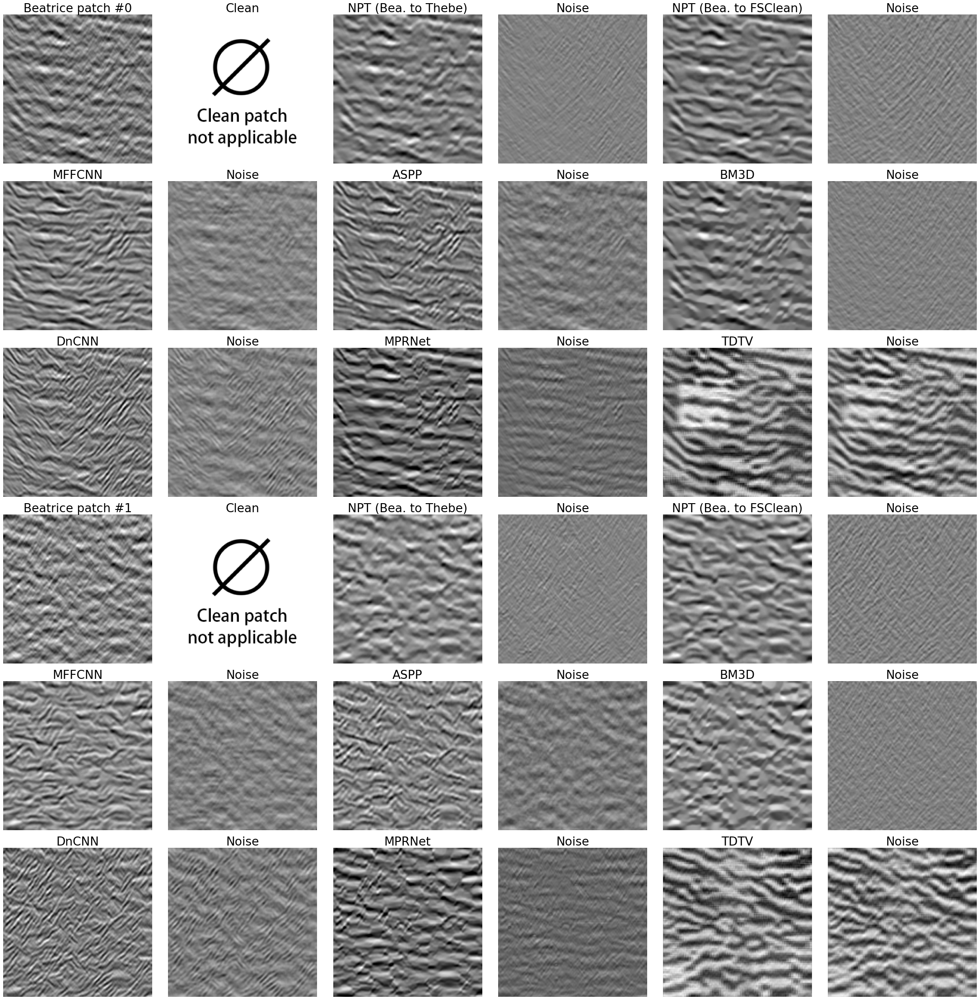

In [20]:
import math
# --------------------------------------------
# PSNR
# --------------------------------------------
def calculate_psnr(img1, img2, border=20):
    # img1 and img2 have range [0, 255]
    #img1 = img1.squeeze()
    #img2 = img2.squeeze()
    img1 = normalize(img1,0,255)
    img2 = normalize(img2,0,255)
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    h, w = img1.shape[:2]
    img1 = img1[border:h-border, border:w-border]
    img2 = img2[border:h-border, border:w-border]

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))

import time

random.seed(1)

rows = 6

f, axarr = plt.subplots(6, rows, figsize = (40,40))
[axi.set_axis_off() for axi in axarr.ravel()]
plt.subplots_adjust(wspace =-0.1, hspace =0.12)
plt.rcParams.update({'font.size': 22})

_need_psnr = False

for ite in range(0,6,3):

    idx = random.randint(0, 1000)
    s_ori = np.load('./parameter_test/beatrice_content_256/{}.npy'.format(idx)) #test_for_show_noise
    s = Image.fromarray(s_ori)
    s = np.array(s)
    s = normalize(s, 0, 1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)

    
    axarr[ite, 0].set_title('Beatrice patch #{}'.format(ite//2))
    axarr[ite, 0].imshow(s, cmap='gray')
    if _need_psnr:
        axarr[ite, 1].set_title(calculate_psnr(target, s))
    else:
        axarr[ite, 3].set_title('Clean image')
    axarr[ite, 1].set_title('Clean')
    axarr[ite, 1].imshow(Image.open('no_clean.png'), cmap='gray')

#     img_E = normalize(np.load('/home/haiwen/noise_reduction/gen.npy'), 0, 1)
    img_E = model_c_thebe_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[ite, 2].set_title('NPT (Bea. to Thebe)') # Beatrice to Thebe
    axarr[ite, 2].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite, 3].set_title(calculate_psnr(target, -img_E))
    else:
        axarr[ite, 3].set_title('Noise')
    axarr[ite, 3].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())
    
    img_E = model_c_synthetic_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[ite, 4].set_title('NPT (Bea. to FSClean)') # Beatrice to Synthetic
    axarr[ite, 4].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite, 5].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite, 5].set_title('Noise')
    axarr[ite, 5].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())


    s = Image.fromarray(s_ori)
    s = s.resize((128,128), Image.BILINEAR)
    s = np.array(s)
    s = normalize(s, 0, 1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)
    
    img_E = model_mffcnn_clip(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[ite + 1, 0].set_title('MFFCNN') # MFFCNN
    axarr[ite + 1, 0].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 1, 1].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite + 1, 1].set_title('Noise')
    axarr[ite + 1, 1].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())

    img_E = model_asppcnn_clip(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[ite + 1, 2].set_title('ASPP') # ASPP
    axarr[ite + 1, 2].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 1, 3].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite + 1, 3].set_title('Noise')
    axarr[ite + 1, 3].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())
    
    s = Image.fromarray(s_ori)
#     s = s.resize((224,224), Image.BILINEAR)
    s = np.array(s)
    s = normalize(s, 0, 1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)
    
    img_E = bm3d.bm3d(s, sigma_psd=0.15, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

    axarr[ite + 1, 4].set_title('BM3D') # BM3D
    axarr[ite + 1, 4].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 1, 5].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite + 1, 5].set_title('Noise')
    axarr[ite + 1, 5].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())

    
    img_E = model_synthetic_only_clip(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[ite + 2, 0].set_title('DnCNN') # 
    axarr[ite + 2, 0].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 2, 1].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite + 2, 1].set_title('Noise')
    axarr[ite + 2, 1].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())
    

    img_E = rgb_to_npy(model_mprnet(npy_to_rgb(s))[0].data.permute(0, 2, 3, 1).squeeze().float().cpu().numpy())
    
    axarr[ite + 2, 2].set_title('MPRNet') # TV
    axarr[ite + 2, 2].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 2, 3].set_title(calculate_psnr(target, img_E))
    else:
        axarr[ite + 2, 3].set_title('Noise')
    axarr[ite + 2, 3].imshow(img_E-s, cmap='gray', vmin=-0.5, vmax=0.5)
    print((img_E-s).min(),(img_E-s).max())
    
    img_E = normalize(np.load('tdtv_patch_{}_f.npy'.format(idx)), 0, 1)
    
    axarr[ite + 2, 4].set_title('TDTV') # TV
    axarr[ite + 2, 4].imshow(img_E, cmap='gray')

    if _need_psnr:
        axarr[ite + 2, 5].set_title(calculate_psnr(target, img_E), vmin=-0.5, vmax=0.5)
    else:
        axarr[ite + 2, 5].set_title('Noise')
    axarr[ite + 2, 5].imshow(img_E-s, cmap='gray')
    print((img_E-s).min(),(img_E-s).max())

    
plt.savefig('denoising.pdf', bbox_inches='tight')

/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3509: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/home/haiwen/anaconda3/envs/dncnn/lib/python3.6/site-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore th

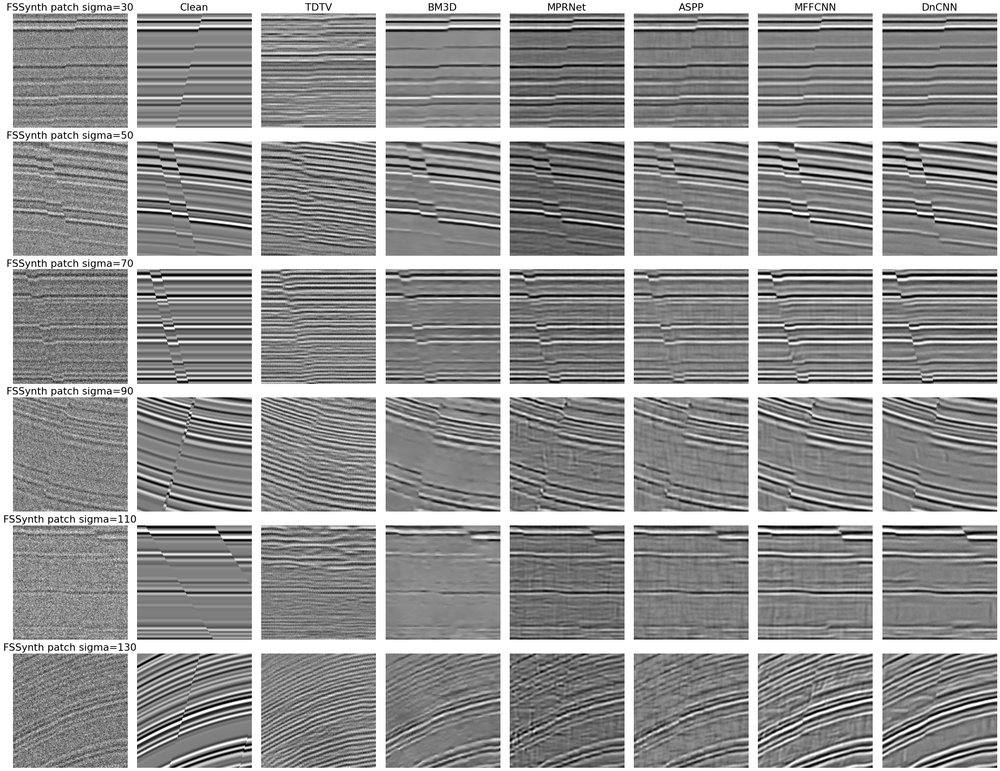

In [8]:
import math
# --------------------------------------------
# PSNR
# --------------------------------------------
def calculate_psnr(img1, img2, border=20):
    # img1 and img2 have range [0, 255]
    #img1 = img1.squeeze()
    #img2 = img2.squeeze()
    img1 = normalize(img1,0,255)
    img2 = normalize(img2,0,255)
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    h, w = img1.shape[:2]
    img1 = img1[border:h-border, border:w-border]
    img2 = img2[border:h-border, border:w-border]

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))

import time

random.seed(666)

rows = 8

f, axarr = plt.subplots(6, rows, figsize = (39,30))
[axi.set_axis_off() for axi in axarr.ravel()]
plt.rcParams.update({'font.size': 18})
plt.subplots_adjust(wspace =-0.1, hspace =0.12)
plt.rcParams.update({'font.size': 18})

_need_psnr = True

for ite, n_st in zip(range(0,6), [30,50,70,90,110,130]):

    s_ori = np.load('/home/haiwen/noise_reduction/data_final/noise_data/synthetic_multi_{}/s{}.npy'.format(n_st, 30 + ite + 100 * (ite % 2))) #test_for_show_noise
    target = np.load('/home/haiwen/noise_reduction/data_final/field_data/synthetic_multi/{}.npy'.format(30 + ite + 100 * (ite % 2))) # test_for_show
    idx = random.randint(100,10000)
    
    s = normalize(s_ori,0,1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)

    
    axarr[ite, 0].set_title('FSSynth patch sigma={}'.format(n_st))
    axarr[ite, 0].imshow(s[20:192-20,20:192-20], cmap='gray')
    
    img_E = denoise_tv_chambolle(s, weight=0.1)

    axarr[0, 1].set_title('Clean') # Beatrice to Synthetic
    axarr[ite, 1].imshow(target[20:192-20,20:192-20], cmap='gray')
    
    img_E = normalize(np.load('/home/haiwen/noise_reduction/tdtv_patch_{}_{}.npy'.format(n_st, ite)), 0, 1)

#     axarr[0, 2].set_title('TDTV') # Beatrice to Thebe
#     axarr[ite, 2].imshow(-img_E[20:192-20,20:192-20], cmap='gray')

#     img_E = model_c_thebe_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
#     axarr[0, 1].set_title('Beatrice->thebe') # MFFCNN
#     axarr[ite, 1].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
#     img_E = model_c_synthetic_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
#     axarr[0, 2].set_title('Beatrice->Syn') # MFFCNN
#     axarr[ite, 2].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
    img_E = model_mffcnn(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    
    axarr[0, 6].set_title('MFFCNN') # MFFCNN
    axarr[ite, 6].imshow(img_E[20:192-20,20:192-20], cmap='gray')

    img_E = model_asppcnn(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[0, 5].set_title('ASPP') # ASPP
    axarr[ite, 5].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
    img_E = bm3d.bm3d(s, sigma_psd=0.15, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

    axarr[0, 3].set_title('BM3D') # BM3D
    axarr[ite, 3].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
    img_E = rgb_to_npy(model_mprnet(npy_to_rgb(s))[0].data.permute(0, 2, 3, 1).squeeze().float().cpu().numpy())
    
    axarr[0, 4].set_title('MPRNet') # TV
    axarr[ite, 4].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
    img_E = model_o_synthetic_only(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()

    axarr[0, 7].set_title('DnCNN') # 
    axarr[ite, 7].imshow(img_E[20:192-20,20:192-20], cmap='gray')
    
    axarr[0, 2].set_title('TDTV') # 
    axarr[ite, 2].imshow(np.load("tdtv_patch_{}_{}_f.npy".format(ite, n_st)), cmap='gray')

plt.savefig('synthetic_denoising.pdf', bbox_inches='tight')

[19.99206785 19.38445469 18.19718871 22.67253025 22.7374235  28.15804753
 23.56059489 22.84185088 12.1606435 ]
[17.03089341 16.16438903 15.60977655 26.3660779  23.6496788  24.75316969
 26.53500869 17.47469062 10.70378547]
[15.38748266 14.68223196 13.5196502  25.39757713 21.34706806 20.2361313
 25.28861867 22.53428367 11.306986  ]
[15.36738254 14.61987535 14.27377318 23.48173239 20.45744287 20.68343447
 23.71355978 21.09060411 11.3803116 ]
[15.78464236 15.62079904 14.91524286 24.88698346 22.19787028 19.89628725
 24.60551228 20.49673318 12.49891733]
[13.37125529 12.88665246 12.13006125 20.51025068 15.56910357 16.39704298
 21.0422393  15.62810217 10.28528155]
[0.         0.00063147 0.00060407 0.00080763 0.00051796 0.13609673
 0.00068588 0.00876906]


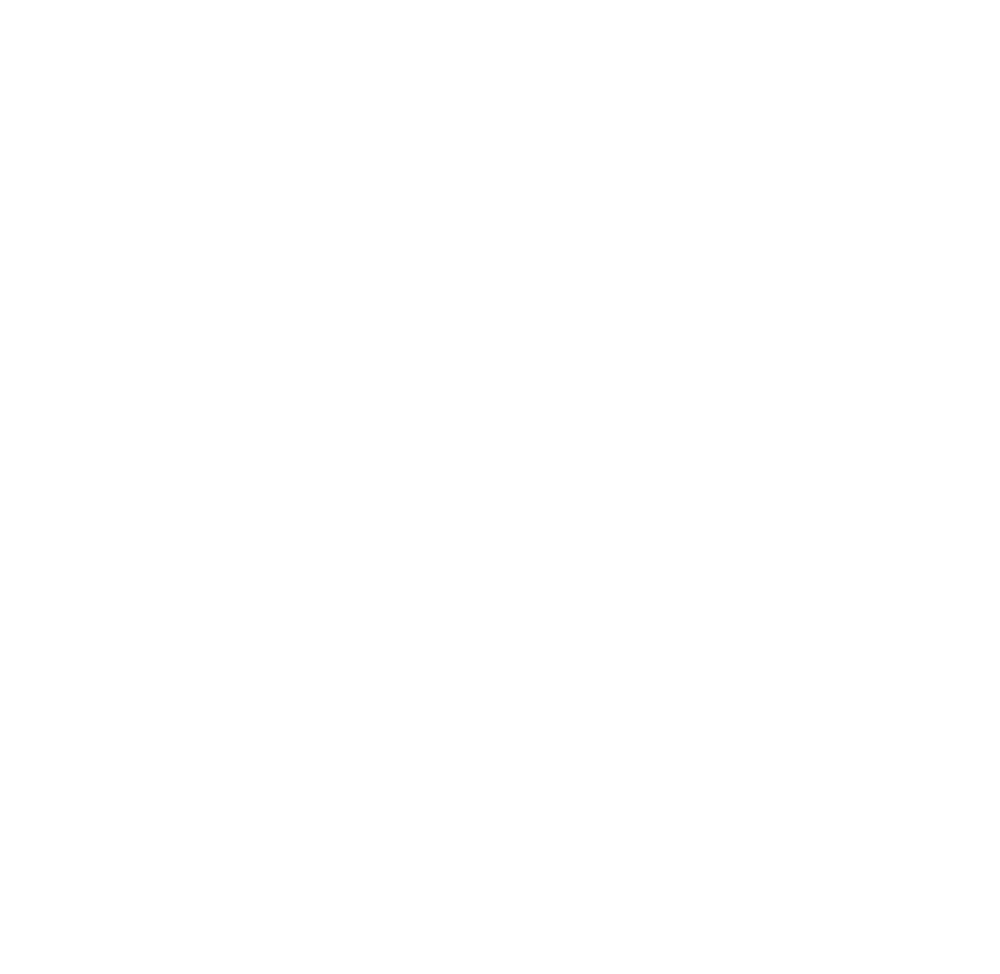

In [10]:
import math
# --------------------------------------------
# PSNR
# --------------------------------------------
def calculate_psnr(img1, img2, border=20):
    # img1 and img2 have range [0, 255]
    #img1 = img1.squeeze()
    #img2 = img2.squeeze()
    img1 = normalize(img1,0,255)
    img2 = normalize(img2,0,255)
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    h, w = img1.shape[:2]
    img1 = img1[border:h-border, border:w-border]
    img2 = img2[border:h-border, border:w-border]

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))

import time

random.seed(666)

rows = 8

f, axarr = plt.subplots(10, rows, figsize = (40,40))
[axi.set_axis_off() for axi in axarr.ravel()]
plt.subplots_adjust(wspace =-0.1, hspace =0.12)
plt.rcParams.update({'font.size': 16})

time_cost = [0,0,0,0,0,0,0,0]

for ite, n_st in zip(range(0,6), [30,50,70,90,110,130]):
    
    psnr = [0,0,0,0,0,0,0,0,0]
    

    s_ori = np.load('/home/haiwen/noise_reduction/data_final/noise_data/synthetic_multi_{}/s{}.npy'.format(n_st, 30 + ite + 100 * (ite % 2))) #test_for_show_noise
    target = np.load('/home/haiwen/noise_reduction/data_final/field_data/synthetic_multi/{}.npy'.format(30 + ite + 100 * (ite % 2))) # test_for_show

    s = Image.fromarray(s_ori)
#         s = s.resize((256,256), Image.BILINEAR)
    s = normalize(s,0,1)
    img_L = np.expand_dims(s, axis=2)  # HxWx1
    img_L = single2tensor4(img_L)
    img_L = img_L.to(device)

    psnr[0] += calculate_psnr(target, s)

    st_time = time.time()
    img_E = model_c_thebe_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    time_cost[1]+= time.time() - st_time
    psnr[1] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = model_c_synthetic_s_beatrice(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    time_cost[2]+= time.time() - st_time
    psnr[2] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = model_mffcnn(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    time_cost[3]+= time.time() - st_time
    psnr[3] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = model_asppcnn(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    time_cost[4]+= time.time() - st_time
    psnr[4] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = bm3d.bm3d(s, sigma_psd=0.15, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
    time_cost[5]+= time.time() - st_time
    psnr[5] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = model_o_synthetic_only(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
    time_cost[6]+= time.time() - st_time
    psnr[6] += calculate_psnr(target, img_E)


    st_time = time.time()
    img_E = rgb_to_npy(model_mprnet(npy_to_rgb(s))[0].data.permute(0, 2, 3, 1).squeeze().float().cpu().numpy())
    time_cost[7]+= time.time() - st_time
    psnr[7] += calculate_psnr(target, img_E)

    img_E = np.load('/home/haiwen/noise_reduction/tdtv_patch_{}_{}_f.npy'.format(mess, ite))
    psnr[8] += calculate_psnr(target, img_E)
    
    print(np.asarray(psnr))

print(np.asarray(time_cost)/60)

In [50]:
import numpy.fft as nf

def fft(img0):
    h, w = img0.shape
    fft_pow_0 = np.zeros((h))
    for i in range(0,w):
        fft_1d = np.fft.fft(img0[:,i])
        fft_pow_0 = fft_pow_0 + np.abs(fft_1d)

    fft_freq = nf.fftfreq(h, 0.1)
    
    return fft_freq, fft_pow_0

In [12]:
beatrice_trace = full_trace('beatrice')

loading data from beatrice
load success, data shape is (901, 1200, 1861)


In [13]:
def normalize_with_minmax(img, min_val = 0, max_val = 1):
    return (img - np.min(img)) / (np.max(img) - np.min(img)) * (max_val - min_val) + min_val, np.min(img), np.max(img)

def rescale(img, old_min, old_max):
    return img * (old_max - old_min) + old_min

def bm3d_processing(_patch):
    return bm3d.bm3d(_patch, sigma_psd=1000, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

def tv_processing(_patch):
    return denoise_tv_chambolle(_patch, weight=10)

border = 192
patch_size = 256

def get_patches(model, patch, model_type = 'cnn'):
    final = None
    noise_final = None
    border_step = patch_size - border
    if model_type == 'cnn' or model_type == 'MPRNet':
        for i in range(0,patch_h-border,border_step):
            row_patch = None
            noise_row_patch = None
            for j in range(0,patch_w-border,border_step):
                s_ori = patch[i:i+patch_size,j:j+patch_size]
                s, s_min, s_max = normalize_with_minmax(s_ori, 0, 1)
                img_L = np.expand_dims(s, axis=2)  # HxWx1
                img_L = single2tensor4(img_L)
                img_L = img_L.to(device)
                if model_type == 'MPRNet':
                    img_E = rgb_to_npy(model(npy_to_rgb(s))[0].data.permute(0, 2, 3, 1).squeeze().float().cpu().numpy())
                else:
                    img_E = model(img_L).data.squeeze().float().clamp_(0, 1).cpu().numpy()
                img_E = rescale(img_E, s_min, s_max)
                img_E = img_E[border // 2:patch_size-border // 2,border // 2:patch_size-border // 2]
                noise_E = img_E - s_ori[border // 2:patch_size-border // 2,border // 2:patch_size-border // 2]
                if row_patch is None:
                    row_patch = img_E
                    noise_row_patch = noise_E
                else:
                    row_patch = np.hstack((row_patch, img_E))
                    noise_row_patch = np.hstack((noise_row_patch, noise_E))
            if final is None:
                final = row_patch
                noise_final = noise_row_patch
            else:
                final = np.vstack((final, row_patch))
                noise_final = np.vstack((noise_final, noise_row_patch))
    else:
        final = model(patch)
        noise_final = final - patch
    return final, noise_final

# reselect a new patch
patch_h, patch_w = patch_size * 2, patch_size * 2
# z = random.randint(0, beatrice_trace.shape[0]-1)
# the_patch = np.flipud(beatrice_trace[z])
# y, x = random.randint(0, the_patch.shape[0] - patch_h - 1), random.randint(0, the_patch.shape[1] - patch_w - 1)

# selected_patch = the_patch[y:y+patch_h, x:x+patch_w]

# plt.figure(figsize = (5,5))
# plt.imshow(selected_patch, cmap = 'seismic')

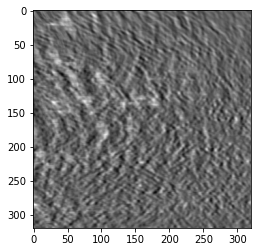

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig, ax = plt.subplots()

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = []
for i in range(0, cube_size):
    im = ax.imshow(noise_cube[:,:,i], cmap='gray', animated=True)
#     im = ax.imshow(noise_cube[:,i,:], cmap='gray', animated=True)
#     im = ax.imshow(noise_cube[i,:,:], cmap='gray', animated=True)
    if i == 0:
#         ax.imshow(noise_cube[i,:,:], cmap='gray')  # show an initial one first
#         ax.imshow(noise_cube[:,i,:], cmap='gray')  # show an initial one first
        ax.imshow(noise_cube[:,:,i], cmap='gray')  # show an initial one first
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

# To save the animation, use e.g.
#
ani.save("movie_ho.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

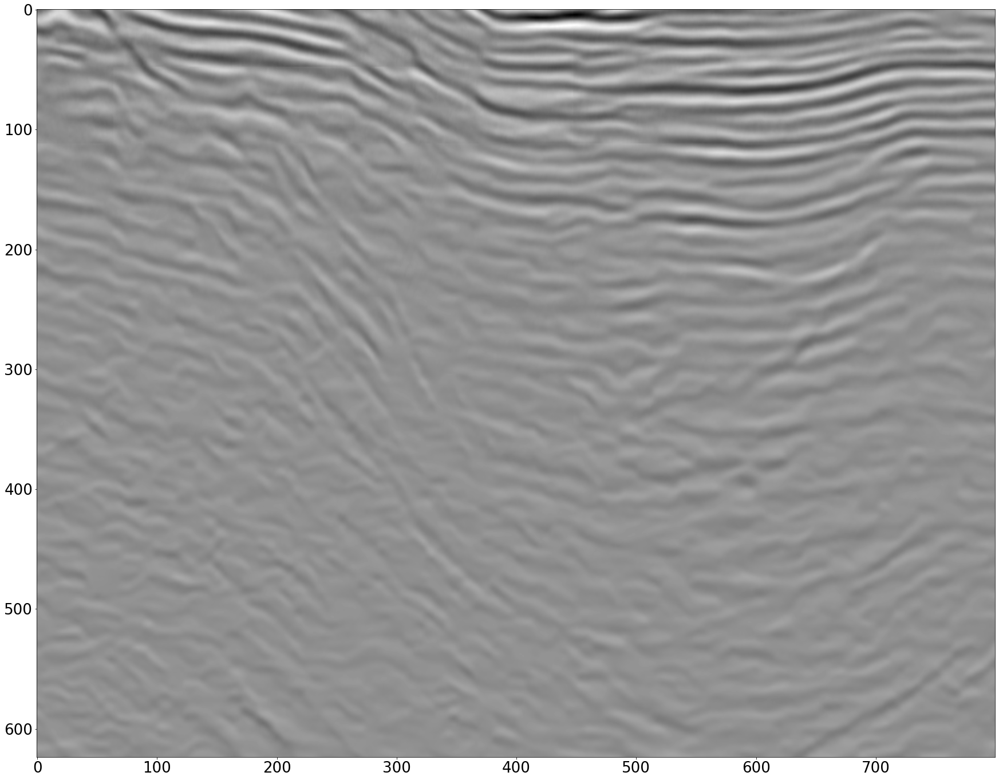

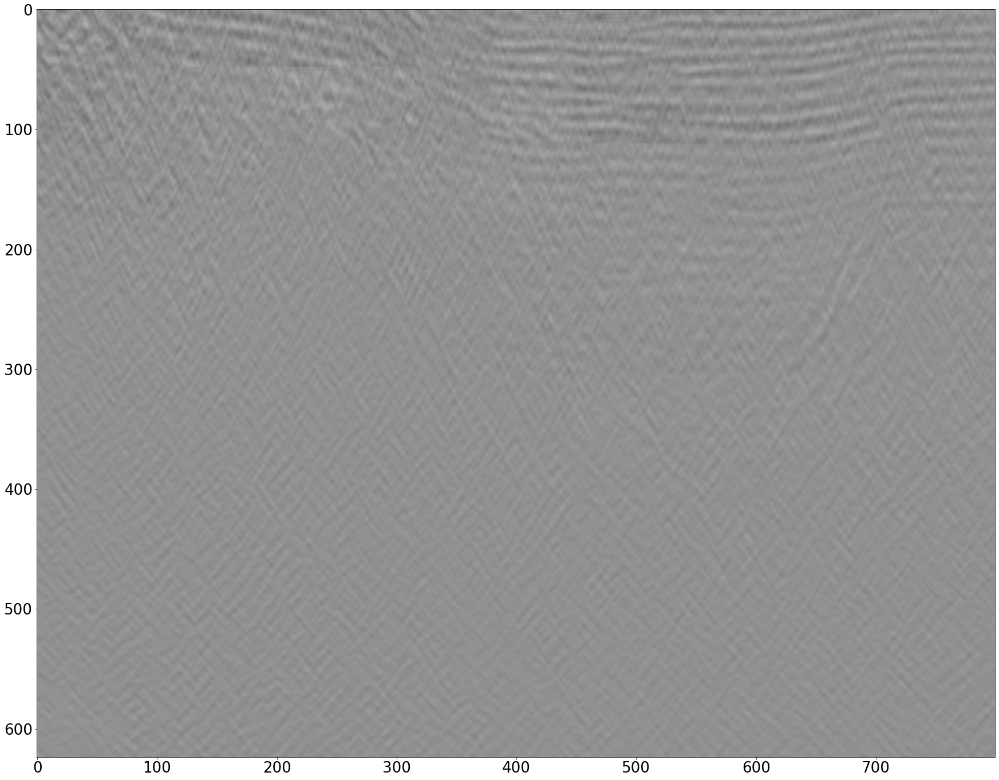

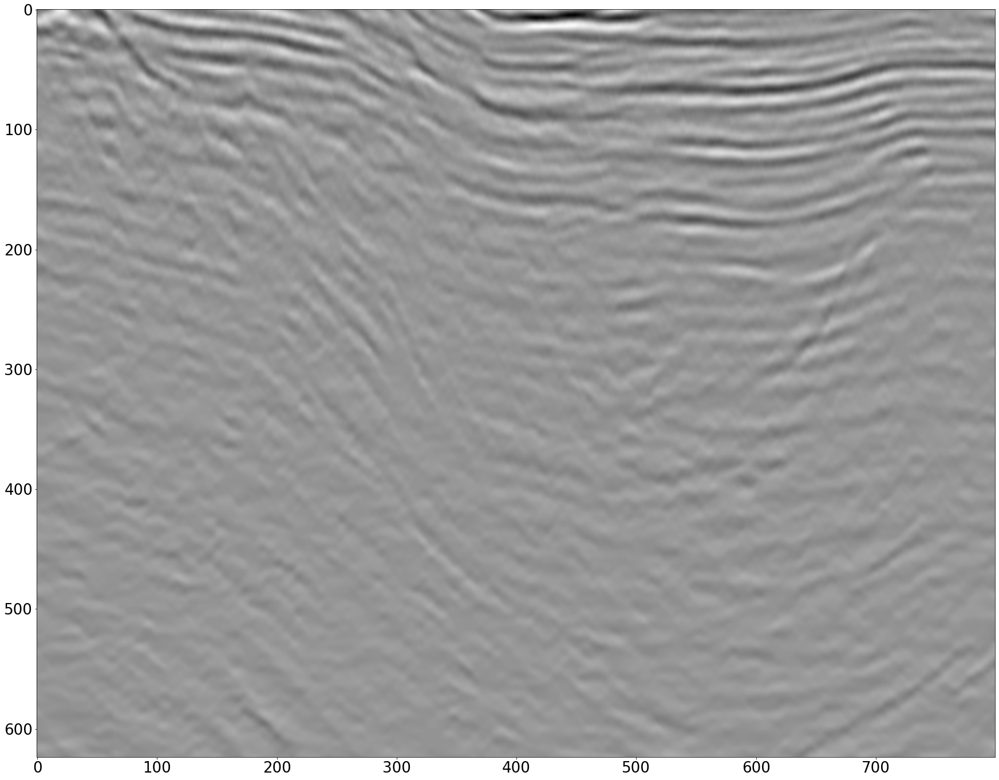

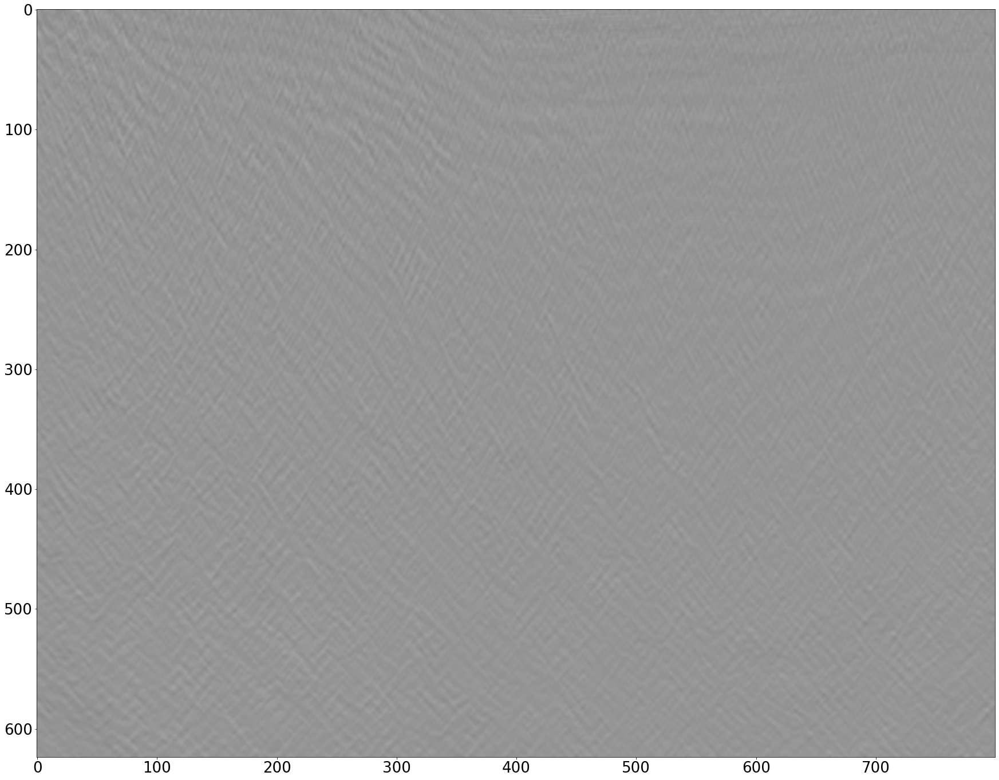

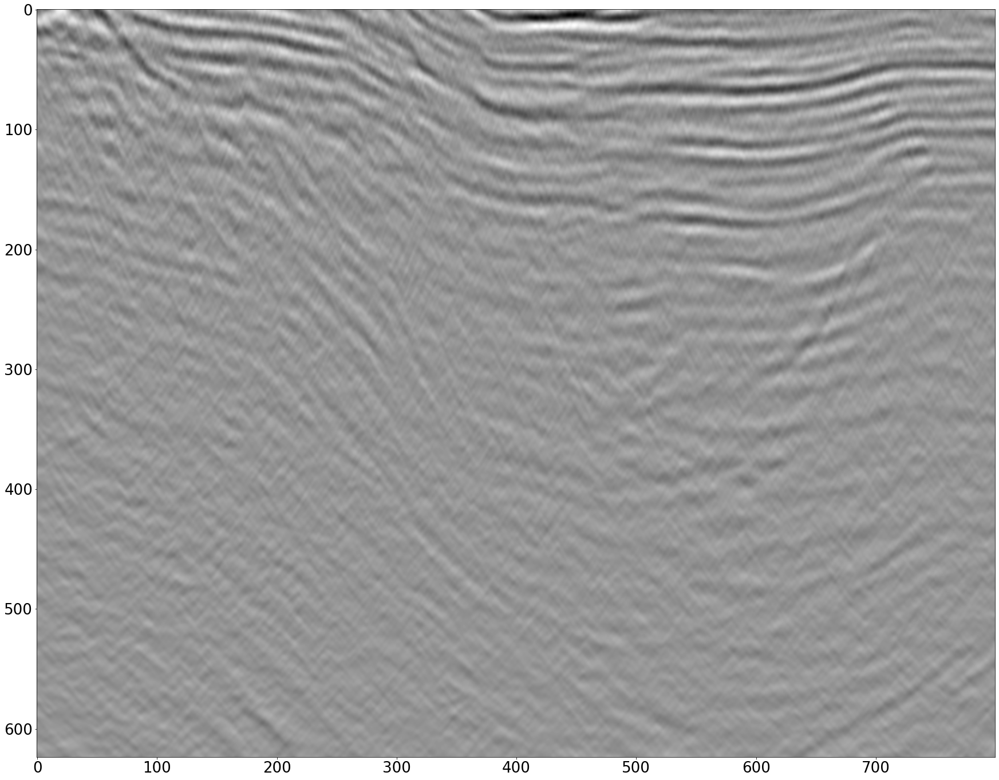

In [14]:
selected_patch = np.flipud(beatrice_trace[0])
patch_h, patch_w = selected_patch.shape
clean_patch, noise_patch = get_patches(model_c_synthetic_s_beatrice, selected_patch, 'cnn')

plt.rcParams.update({'font.size': 26})
plt.figure(figsize = (30,40))
plt.imshow(clean_patch[400:,:800], cmap = 'gray')
plt.savefig('denoised-synthetic.png', bbox_inches='tight')
plt.figure(figsize = (30,40))
plt.imshow(noise_patch[400:,:800], cmap = 'gray', vmin = clean_patch[400:,:800].min(), vmax = clean_patch[400:,:800].max())
plt.savefig('noise-synthetic.png', bbox_inches='tight')

selected_patch = np.flipud(beatrice_trace[0])
patch_h, patch_w = selected_patch.shape
clean_patch, noise_patch = get_patches(model_c_thebe_s_beatrice, selected_patch, 'cnn')

plt.figure(figsize = (30,40))
plt.imshow(clean_patch[400:,:800], cmap = 'gray')
plt.savefig('denoised-thebe.png', bbox_inches='tight')
plt.figure(figsize = (30,40))
plt.imshow(noise_patch[400:,:800], cmap = 'gray', vmin = clean_patch[400:,:800].min(), vmax = clean_patch[400:,:800].max())
plt.savefig('noise-thebe.png', bbox_inches='tight')
plt.figure(figsize = (30,40))
plt.imshow(selected_patch[400+192//2:400+192//2+clean_patch[400:,:].shape[0],192//2:800+192//2], cmap = 'gray')
plt.savefig('raw.png', bbox_inches='tight')

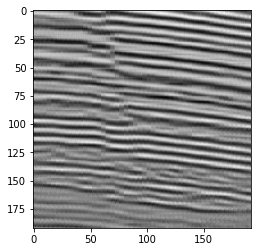

In [10]:
plt.imshow(np.load('tdtv_patch_1_50.npy'), cmap='gray')